![ga4](https://www.google-analytics.com/collect?v=2&tid=G-6VDTYWLKX6&cid=1&en=page_view&sid=1&dl=statmike%2Fvertex-ai-mlops%2FApplied+GenAI&dt=Vertex+AI+GenAI+Embeddings.ipynb)

---
# Vertex AI GenAI Embeddings

Embeddings are vector representations of text or images or both.  These are vectors of floating point numbers that come from a model that has been trained to embed content in a way that efficiently represents the content.  

> Confused by the word "vector"?  In this case, it is just a list of decimal numbers in Python! 

Embeddings can be used:
- To find similar content with vector similarity searches
- Clutering content in groups with similiar attributes
- Detect anomaly or outlier observations
- Classification models - use embeddings as features to predict classes

This notebook shows how to work with Vertex AI text-embeddings API and multimodal embeddings API in detail.

**More Resources In This Repository**

For an overview of foundation models on Vertex AI, like embeddings, check out the workflow in [Getting Started - Vertex AI GenAI Python Client](Getting%20Started%20-%20Vertex%20AI%20GenAI%20Python%20Client.ipynb).

To see an application of embeddings a features in machine learning check out the workflow in [Vertex AI GenAI Embeddings - As Features For Hierarchical Classification](./Vertex%20AI%20GenAI%20Embeddings%20-%20As%20Features%20For%20Hierarchical%20Classification.ipynb)

---
## Data Source: data about all types of life on Earth

Remember learning about [taxonomix rank](https://en.wikipedia.org/wiki/Taxonomic_rank) in biology? 


<center>
$\text{Kingdom} > \text{Phylum} > \text{Class} > \text{Order} > \text{Family} > \text{Genus} > \text{Species}$
</center>


The Global Biodiversity Information Facility, or [GBIF](https://www.gbif.org/), is an international network that gives open access to data about life on Earth. One of these sources is [occurences](https://www.gbif.org/occurrence/search), a record of observations for species at specific locations.  This data is updated monthly in BigQuery: [gbif-occurecnes](https://console.cloud.google.com/marketplace/product/bigquery-public-data/gbif-occurrences).  This can be queried as a BigQuery public dataset table at `bigquery-public-data.gbif.occurrences`. Helpful guides to the schema can be found here: [schema Details](https://github.com/gbif/occurrence/blob/master/gc-public-data.md#gbif-public-datasets-on-google-cloud)

There are images, video, and/or sound associated with some of the occurences.  This is indicated by value in the filed path `mediatype.array.array_element` as `StillImage`, `MovingImage`, and `Sound`.  While the media files are not located in BigQuery they can be retrieved.  The official Python API for gbif is [pygbif](https://pygbif.readthedocs.io/en/latest/index.html).  Using `pygbif.occurrences.get()` the full details of an occurence can be retrieved.  This includes a field for `media` that is a list of object properties like:

```
pygbif.occurrences.get('1458578715')['media']

[{'type': 'StillImage',
  'format': 'image/jpeg',
  'references': 'https://www.artportalen.se/Image/524649',
  'created': '2008-11-04T00:00:00.000+00:00',
  'license': '© all rights reserved',
  'rightsHolder': 'Jan Lundgren',
  'identifier': 'https://www.artportalen.se/MediaLibrary/bugs/2008/large/107103.jpg'}]
```

The `identifier` key can be used to retrieve the media.


---
## Colab Setup

To run this notebook in Colab click [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/statmike/vertex-ai-mlops/blob/main/Applied%20GenAI/Vertex%20AI%20GenAI%20Embeddings.ipynb) and run the cells in this section.  Otherwise, skip this section.

This cell will authenticate to GCP (follow prompts in the popup).

In [1]:
PROJECT_ID = 'statmike-mlops-349915' # replace with project ID

In [2]:
try:
    import google.colab
    from google.colab import auth
    auth.authenticate_user()
    !gcloud config set project {PROJECT_ID}
except Exception:
    pass

---
## Installs

The list `packages` contains tuples of package import names and install names.  If the import name is not found then the install name is used to install quitely for the current user.

In [64]:
# tuples of (import name, install name)
packages = [
    ('google.cloud.aiplatform', 'google-cloud-aiplatform'),
    ('pygbif', 'pygbif')
]

import importlib
install = False
for package in packages:
    if not importlib.util.find_spec(package[0]):
        print(f'installing package {package[1]}')
        install = True
        !pip install {package[1]} -U -q --user

### Restart Kernel (If Installs Occured)

After a kernel restart the code submission can start with the next cell after this one.

In [2]:
if install:
    import IPython
    app = IPython.Application.instance()
    app.kernel.do_shutdown(True)

---
## Setup

Inputs

In [1]:
project = !gcloud config get-value project
PROJECT_ID = project[0]
PROJECT_ID

'statmike-mlops-349915'

In [2]:
REGION = 'us-central1'
EXPERIMENT = 'embeddings'
SERIES = 'applied-genai'

Packages

In [137]:
import vertexai.language_models
import vertexai.vision_models
from google.cloud import bigquery

import os
import json
import pygbif
import requests
import asyncio
import multiprocessing
import tqdm
import time
import IPython.display 

Clients

In [4]:
# vertex ai clients
vertexai.init(project = PROJECT_ID, location = REGION)

# bigquery client
bq = bigquery.Client(project = PROJECT_ID)

parameters:

In [5]:
DIR = f"temp/{EXPERIMENT}"

environment:

In [6]:
if not os.path.exists(DIR):
    os.makedirs(DIR)

---
## Find Some Species

Select from `family = 'Canidae'`:
- up to 10 records for each `species`:
- include all `genus` values
- only include records with a 'StillImage' available
- select the most recent records based on `eventdate`

In [7]:
n_per_strata = 2

query = f'''
WITH
    sample AS (
        SELECT *,
            ROW_NUMBER() OVER (PARTITION BY family, genus, species ORDER BY eventdate DESC) as sequence
        FROM `bigquery-public-data.gbif.occurrences`
        WHERE 
            'StillImage' in UNNEST(mediatype.array.array_element)
            AND family = 'Canidae'
            AND genus IS NOT NULL
            AND species IS NOT NULL
    )
SELECT * EXCEPT(sequence)
FROM sample
WHERE sequence <= {n_per_strata}
ORDER BY family, genus, species
'''

In [8]:
samples = bq.query(query = query).to_dataframe()

In [9]:
samples

,gbifid,datasetkey,occurrenceid,kingdom,phylum,class,order,family,genus,species,...,identifiedby,dateidentified,license,rightsholder,recordedby,typestatus,establishmentmeans,lastinterpreted,mediatype,issue
0,1317047134,c8681cc2-9d0a-4c5f-b620-5c753abfe2bc,http://n2t.net/ark:/65665/3c23b5b15-3d38-4795-...,Animalia,Chordata,Mammalia,Carnivora,Canidae,Aelurodon,Aelurodon ferox,...,{'array': []},NaT,CC0_1_0,None,{'array': [{'array_element': 'Grady & Chaney'}]},{'array': []},None,2023-08-26 06:01:36.408000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'OCCURRENCE_STATU...
1,1316636678,c8681cc2-9d0a-4c5f-b620-5c753abfe2bc,http://n2t.net/ark:/65665/31f8966f8-7867-4f52-...,Animalia,Chordata,Mammalia,Carnivora,Canidae,Aelurodon,Aelurodon ferox,...,{'array': []},NaT,CC0_1_0,None,{'array': [{'array_element': 'Grady & Chaney'}]},{'array': []},None,2023-08-26 06:01:32.409000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'OCCURRENCE_STATU...
2,1039448881,9643f840-f762-11e1-a439-00145eb45e9a,urn:uuid:f03feaac-8bfc-432a-af61-b5367664fe6e,Animalia,Chordata,Mammalia,Carnivora,Canidae,Aelurodon,Aelurodon taxoides,...,{'array': [{'array_element': 'John B. Hatcher'}]},1894-01-01 00:00:00+00:00,CC0_1_0,Yale Peabody Museum,"{'array': [{'array_element': 'John B. Hatcher,...",{'array': [{'array_element': 'HOLOTYPE'}]},None,2023-09-01 01:13:22.454000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'OCCURRENCE_STATU...
3,787069785,58d0f326-2e85-4d0a-a744-571461220f00,urn:catalog:UCMP:V:33478,Animalia,Chordata,Mammalia,Carnivora,Canidae,Aelurodon,Aelurodon taxoides,...,{'array': []},NaT,CC_BY_4_0,None,{'array': [{'array_element': 'WPA PARTY'}]},{'array': []},None,2023-08-28 15:56:57.764000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'TYPE_STATUS_INVA...
4,1039426977,9643f840-f762-11e1-a439-00145eb45e9a,urn:uuid:a50b5ab2-1887-49b1-aa03-e6a45a5f8e62,Animalia,Chordata,Mammalia,Carnivora,Canidae,Aelurodon,Canis wheelerianus,...,{'array': [{'array_element': 'William J. Sincl...,1915-01-01 00:00:00+00:00,CC0_1_0,Yale Peabody Museum,"{'array': [{'array_element': 'A. C. Whitford, ...",{'array': []},None,2023-09-01 01:13:20.945000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'OCCURRENCE_STATU...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,4177416827,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/17776...,Animalia,Chordata,Mammalia,Carnivora,Canidae,Vulpes,Vulpes velox,...,{'array': [{'array_element': 'Nick Cairns'}]},2023-08-11 02:31:16+00:00,CC_BY_NC_4_0,Nick Cairns,{'array': [{'array_element': 'Nick Cairns'}]},{'array': []},None,2023-08-28 23:51:38.874000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'COORDINATE_ROUND...
130,4402290667,963a6b96-4d22-4428-86e4-afee52cf4a8e,https://arter.dk/observation/record-details/c4...,Animalia,Chordata,Mammalia,Carnivora,Canidae,Vulpes,Vulpes vulpes,...,{'array': [{'array_element': 'Claus Landbo Ole...,NaT,CC_BY_4_0,None,{'array': [{'array_element': 'Claus Landbo Ole...,{'array': []},None,2023-08-30 18:28:43.469000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'COORDINATE_ROUND...
131,4402290678,963a6b96-4d22-4428-86e4-afee52cf4a8e,https://arter.dk/observation/record-details/ca...,Animalia,Chordata,Mammalia,Carnivora,Canidae,Vulpes,Vulpes vulpes,...,{'array': [{'array_element': 'Claus Andersen'}]},NaT,CC_BY_4_0,None,{'array': [{'array_element': 'Claus Andersen'}]},{'array': []},None,2023-08-30 18:28:28.747000+00:00,{'array': [{'array_element': 'StillImage'}]},{'array': [{'array_element': 'COORDINATE_ROUND...
132,4116368183,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/16158...,Animalia,Chordata,Mammalia,Carnivora,Canidae,Vulpes,Vulpes zerda,...,{'array': [{'array_element': 'solmol'

In [10]:
samples.groupby(['family'])['family'].count()

family
Canidae    134
Name: family, dtype: int64

In [11]:
samples.groupby(['family', 'genus'])['genus'].count()

family   genus        
Canidae  Aelurodon         7
         Atelocynus        2
         Borophagus        8
         Canis            25
         Carpocyon         1
         Cerdocyon         3
         Chrysocyon        2
         Cuon              2
         Cynarctoides      1
         Cynarctus         3
         Cynodesmus        1
         Dusicyon          2
         Enhydrocyon       3
         Epicyon           3
         Eucyon            2
         Hesperocyon       2
         Leptocyon         2
         Lycalopex        10
         Lycaon            2
         Mesocyon          2
         Nyctereutes       4
         Osbornodon        1
         Otocyon           2
         Paracynarctus     2
         Paratomarctus     4
         Protepicyon       1
         Speothos          2
         Tomarctus         6
         Urocyon           4
         Vulpes           25
Name: genus, dtype: int64

In [12]:
samples['genus'].unique()

array(['Aelurodon', 'Atelocynus', 'Borophagus', 'Canis', 'Carpocyon',
       'Cerdocyon', 'Chrysocyon', 'Cuon', 'Cynarctoides', 'Cynarctus',
       'Cynodesmus', 'Dusicyon', 'Enhydrocyon', 'Epicyon', 'Eucyon',
       'Hesperocyon', 'Leptocyon', 'Lycalopex', 'Lycaon', 'Mesocyon',
       'Nyctereutes', 'Osbornodon', 'Otocyon', 'Paracynarctus',
       'Paratomarctus', 'Protepicyon', 'Speothos', 'Tomarctus', 'Urocyon',
       'Vulpes'], dtype=object)

In [13]:
samples['species'].unique()

array(['Aelurodon ferox', 'Aelurodon taxoides', 'Canis wheelerianus',
       'Strobodon stirtoni', 'Atelocynus microtis',
       'Aelurodon meandrinus', 'Borophagus diversidens',
       'Borophagus littoralis', 'Borophagus secundus', 'Pliogulo dudleyi',
       'Canis adustus', 'Canis armbrusteri', 'Canis aureus',
       'Canis dingo', 'Canis dirus', 'Canis edwardii', 'Canis latrans',
       'Canis lepophagus', 'Canis lupaster', 'Canis lupus',
       'Canis lycaon', 'Canis mesomelas', 'Canis simensis',
       'Tomarctus robustus', 'Cerdocyon texanus', 'Cerdocyon thous',
       'Chrysocyon brachyurus', 'Cuon alpinus', 'Canis lemur',
       'Cynarctus crucidens', 'Cynarctus galushai',
       'Tomarctus marylandica', 'Cynodesmus thooides',
       'Dusicyon australis', 'Enhydrocyon crassidens',
       'Enhydrocyon stenocephalus', 'Canis haydeni', 'Canis saevus',
       'Canis davisi', 'Canis gregarius', 'Canis vafer',
       'Lycalopex culpaeus', 'Lycalopex fulvipes',
       'Lycalopex gymn

---
## Retrieve Images

For the sample of occurences above:
- get a list of `gbfid` values
- use the `pygbif` package to retrieve the full details of the record, specifically `media`
- use the `requests` to retrieve the image (the first one) as bytes


### Retrieve Details

Use `pygbif` package for a given `gbfid` to retrieve the `media` details.

In [14]:
gbifid = samples['gbifid'].iloc[3]
gbifid

'787069785'

In [15]:
samples['species'].iloc[3]

'Aelurodon taxoides'

In [16]:
pygbif.occurrences.get(gbifid)['media']

[{'type': 'StillImage',
  'format': 'image/jpeg',
  'title': 'Photograph of specimen.',
  'description': 'Photograph of specimen.',
  'creator': 'Audrey Aronowsky',
  'license': 'http://creativecommons.org/licenses/by/4.0/',
  'rightsHolder': 'University of California Museum of Paleontology',
  'identifier': 'http://calphotos.berkeley.edu/imgs/512x768/0000_0000/0702/0825.jpeg'},
 {'type': 'StillImage',
  'format': 'image/jpeg',
  'title': 'Photograph of specimen.',
  'description': 'Photograph of specimen.',
  'creator': 'Audrey Aronowsky',
  'license': 'http://creativecommons.org/licenses/by/4.0/',
  'rightsHolder': 'University of California Museum of Paleontology',
  'identifier': 'http://calphotos.berkeley.edu/imgs/512x768/0000_0000/0702/0824.jpeg'},
 {'type': 'StillImage',
  'format': 'image/jpeg',
  'title': 'Photograph of specimen.',
  'description': 'Photograph of specimen.',
  'creator': 'Patricia Holroyd',
  'license': 'http://creativecommons.org/licenses/by/4.0/',
  'rightsHo

In [17]:
pygbif.occurrences.get(gbifid)['species']

'Aelurodon taxoides'

### Function To Retrieve Images

This uses `pygbif` and `requests`:

In [18]:
def retriever(gbifid):
    
    # get media info for the gbfid:
    details = pygbif.occurrences.get(gbifid)
    
    # get list of urls for StillImage records
    urls = []
    for m in details['media']:
        if 'type' in m.keys() and 'identifier' in m.keys():
            if m['type'] == 'StillImage':
                urls.append(m['identifier'])
                
    # get image (bytes) for first successful url requests
    image_bytes = b''
    if len(urls) > 0:
        for url in urls:
            try:
                image = requests.get(url).content
                image_bytes = image
                break
            except:
                continue
    
    # prepare response
    return {gbifid : {'image_bytes': image_bytes, 'species': details['species']}}

In [19]:
example = retriever(gbifid)

In [20]:
example[gbifid]['species']

'Aelurodon taxoides'

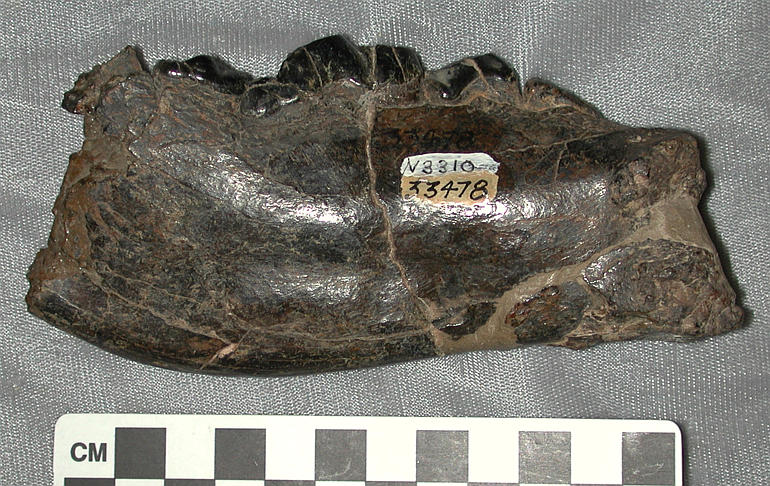

In [21]:
IPython.display.Image(data = example[gbifid]['image_bytes'])

### Retrieve Images For All Samples

**NOTE**

Retrieving media information using `pygbif` and retrieving images using `requests` would be more efficient if done concurrently - asynchronously.  Neither of these packages are setup for concurrency so using threads to handle parallel tasks.  Basically, write a function that does the entire process for a single value of `gbfid` and uses `multiprocessing` package to handle a pool of threads that each work with a separate value of `gbfid`. Read more about multiprocessing in [this tip](../Tips/Python%20Multiprocessing.ipynb).

In [22]:
# set number of threads to manage:
concur_requests = 40

# get input values for function:
inputs = samples['gbifid'].tolist()

# run the inputs through the function in a pool of threads:
begin = time.perf_counter()
pool = multiprocessing.Pool(concur_requests)
results = list(
    tqdm.tqdm(
        pool.imap(retriever, inputs),
        total = len(inputs)
    )
)
pool.close()
pool.join()
end = time.perf_counter()

100%|██████████| 134/134 [03:25<00:00,  1.53s/it]


Convert the list of dictionaries into a dictionary with keys for `gbifid`:

In [23]:
samples_extended = {k: v for result in results for k, v in result.items()}

How many samples?

In [24]:
len(samples_extended.keys())

134

How many of the samples had a downloadable image?

In [25]:
len([samples_extended[k] for k in samples_extended.keys() if samples_extended[k]['image_bytes']])

122

Review an image:

787063634 Borophagus diversidens


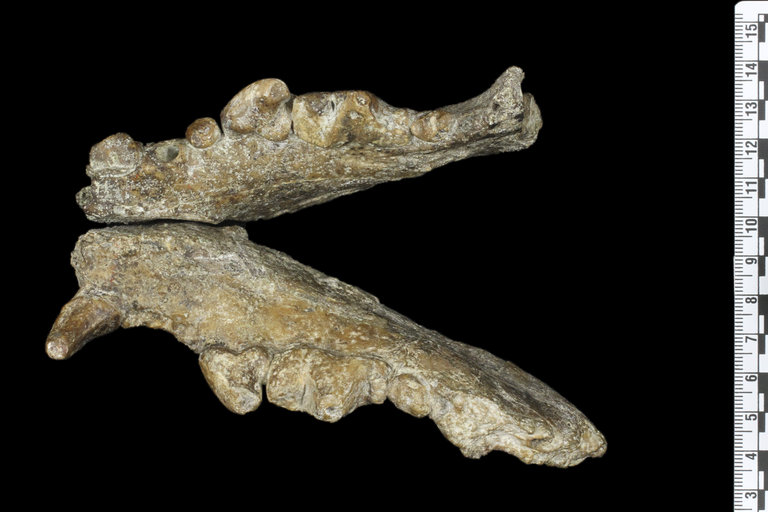

In [26]:
for sample in list(samples_extended.keys())[10:]:
    if samples_extended[sample]['image_bytes']:
        example = samples_extended[sample]['image_bytes']
        print(sample, samples_extended[sample]['species'])
        break

IPython.display.Image(data = example)

---
## Embeddings

Retrieve embeddings for the `species` (text) and the associated image using:

Text Embeddings:
- [Documentation](https://cloud.google.com/vertex-ai/docs/generative-ai/embeddings/get-text-embeddings)
- Python API [vertexai.language_models.TextEmbeddingModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.language_models.TextEmbeddingModel)

Multimodal Embeddings:
- [Documentation](https://cloud.google.com/vertex-ai/docs/generative-ai/embeddings/get-multimodal-embeddings)
- Python API [vertexai.vision_models.MultiModalEmbeddingModel()](https://cloud.google.com/python/docs/reference/aiplatform/latest/vertexai.vision_models.MultiModalEmbeddingModel)

In [27]:
gbifid = samples['gbifid'].iloc[0]
gbifid

'1317047134'

In [28]:
species = samples['species'].iloc[0]
species

'Aelurodon ferox'

In [29]:
species = samples_extended[gbifid]['species']
species

'Aelurodon ferox'

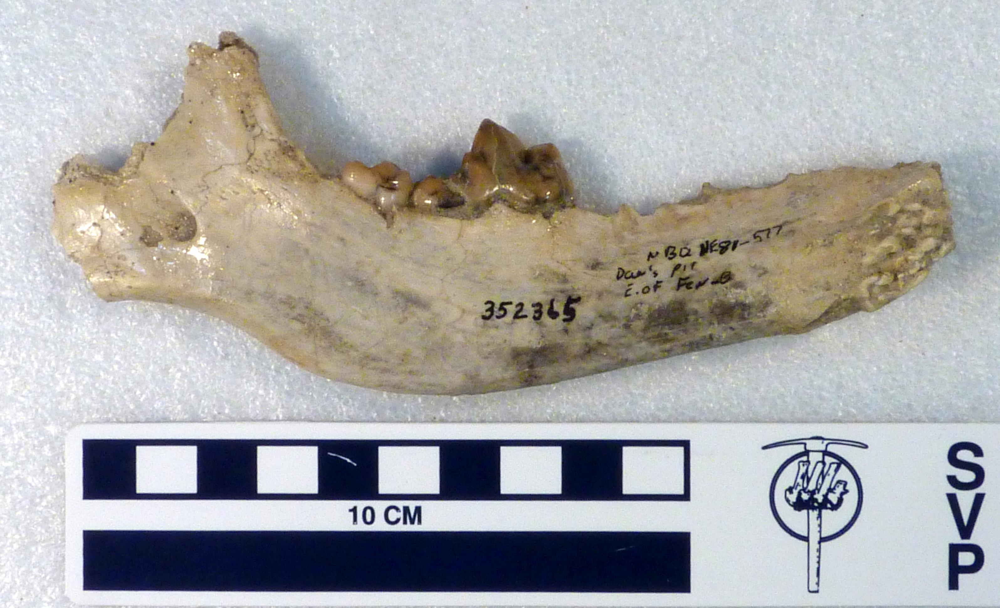

In [30]:
image = vertexai.vision_models.Image(image_bytes = samples_extended[gbifid]['image_bytes'])
image.show()

### Text Embeddings

Get the embedding for the `species` values.

In [31]:
text_embed_model = vertexai.language_models.TextEmbeddingModel.from_pretrained('textembedding-gecko@latest')

In [32]:
embedding = text_embed_model.get_embeddings([species])[0].values

In [33]:
embedding[0:10]

[0.01772073097527027,
 -0.025817478075623512,
 -0.015161016955971718,
 -0.05128904804587364,
 -0.0045186663046479225,
 0.00839784275740385,
 0.00010883607319556177,
 0.007536211516708136,
 0.01381074171513319,
 0.011639888398349285]

### Multimodal Embeddings

In [51]:
multimodal_embed_model = vertexai.vision_models.MultiModalEmbeddingModel.from_pretrained('multimodalembedding@001')

In [55]:
embedding = multimodal_embed_model.get_embeddings(
    contextual_text = species, 
    image = image
)

In [56]:
embedding.text_embedding[0:10]

[-0.02000002,
 -0.0474268,
 -0.0264508408,
 0.0141206374,
 0.0202376302,
 -0.00431113271,
 -0.0017137843,
 -0.0186245516,
 0.0603097454,
 -0.0132486494]

In [57]:
embedding.image_embedding[0:10]

[0.00845474,
 -0.0262310356,
 -0.00670549879,
 0.0578977279,
 0.0014879175,
 0.00791842584,
 0.0365426205,
 0.00307860482,
 0.053206183,
 -0.0201318972]

### Text Embeddings For All Samples

An `asyncio` function that uses the `..get_embeddings_async()` method of the models to handle concurrent requests for embeddings.  Also, handle errors due to query per minute limits on the models.

In [38]:
async def asyncTextEmbeddings(instances, limit_concur_request = 10):
    limit = asyncio.Semaphore(limit_concur_request)
    preds = [None] * len(instances)
    
    async def predictor(p):
        async with limit:
            if limit.locked():
                await asyncio.sleep(.01)
            ######## MODIFY HERE TO DETECT ERRORS AND RETRY ######################################################################
            fail = True
            counter = 0
            while fail and counter <= 20:
                try:
                    pred = await text_embed_model.get_embeddings_async([samples_extended[instances[p]]['species']])
                    fail = False
                    counter = 0
                except:
                    counter += 1
                    await asyncio.sleep(2^(min(counter, 6) - 1))
            if fail:
                pred = []
            ######################################################################################################################
        preds[p] = {instances[p] : {'text_embedding' : pred[0].values}}
        
    async def runner(instances):
        tasks = []
        for p in range(len(instances)):
            task = asyncio.create_task(predictor(p))
            tasks.append(task)
        results = await asyncio.gather(*tasks)
    
    start = time.perf_counter()
    await runner(instances)
    elapsed = time.perf_counter() - start
    print(f'{elapsed:0.5f} seconds')
    
    return preds

In [39]:
instances = list(samples_extended.keys())

In [40]:
text_embeddings = await asyncTextEmbeddings(instances)

0.95992 seconds


In [41]:
text_embeddings = {k: v for te in text_embeddings for k, v in te.items()}

In [42]:
for sample in samples_extended.keys():
    samples_extended[sample]['text_embedding'] = text_embeddings[sample]['text_embedding']

In [43]:
samples_extended['1317047134'].keys()

dict_keys(['image_bytes', 'species', 'text_embedding'])

### Multimodal Embeddings For All Samples


In [44]:
async def asyncMultimodalEmbeddings(instances, limit_concur_request = 10):
    limit = asyncio.Semaphore(limit_concur_request)
    preds = [None] * len(instances)
    
    async def predictor(p):
        async with limit:
            if limit.locked():
                await asyncio.sleep(.01)
            ######## MODIFY HERE TO DETECT ERRORS AND RETRY ######################################################################
            fail = True
            counter = 0
            while fail and counter <= 20:
                try:
                    if samples_extended[instances[p]]['image_bytes']:
                        pred = multimodal_embed_model.get_embeddings(
                            contextual_text = samples_extended[instances[p]]['species'],
                            image = vertexai.vision_models.Image(image_bytes = samples_extended[instances[p]]['image_bytes'])
                        )
                    else:
                        pred = multimodal_embed_model.get_embeddings(
                            contextual_text = samples_extended[instances[p]]['species'],
                            )
                    fail = False
                    counter = 0
                except:
                    counter += 1
                    await asyncio.sleep(2^(min(counter, 6) - 1))
            if fail:
                pred = []
            ######################################################################################################################
        try:
            preds[p] = {instances[p] : {'text_multimodal_embedding' : pred.text_embedding, 'image_multimodal_embedding' : pred.image_embedding}}
        except:
            pred[p] = {instances[p] : {'text_multimodal_embedding' : pred.text_embedding}}
    async def runner(instances):
        tasks = []
        for p in range(len(instances)):
            task = asyncio.create_task(predictor(p))
            tasks.append(task)
        results = await asyncio.gather(*tasks)
    
    start = time.perf_counter()
    await runner(instances)
    elapsed = time.perf_counter() - start
    print(f'{elapsed:0.5f} seconds')
    
    return preds

In [45]:
multimodal_embeddings = await asyncMultimodalEmbeddings(instances)

280.89342 seconds


In [46]:
multimodal_embeddings = {k: v for mme in multimodal_embeddings for k, v in mme.items()}

In [47]:
for sample in samples_extended.keys():
    samples_extended[sample]['text_multimodal_embedding'] = multimodal_embeddings[sample]['text_multimodal_embedding']
    if 'image_multimodal_embedding' in list(multimodal_embeddings[sample].keys()):
        samples_extended[sample]['image_multimodal_embedding'] = multimodal_embeddings[sample]['image_multimodal_embedding']

In [48]:
samples_extended['1317047134'].keys()

dict_keys(['image_bytes', 'species', 'text_embedding', 'text_multimodal_embedding', 'image_multimodal_embedding'])

## Projector

[TensorBoard](https://www.tensorflow.org/tensorboard) has a built-in [Embedding Projector](https://www.tensorflow.org/tensorboard/tensorboard_projector_plugin#saving_data_for_tensorboard)

In [ ]:
from tensorboard.plugins import projector
import numpy as np
import tensorflow as tf
from IPython.display import Markdown
%load_ext tensorboard

### Prepare Data For Projector

Use the `samples_extended` dictionary to assemble list of:
- subset to only examples with images
    - list of labels, `species`
    - list of `text_multimodal_embedding`
    - list of `image_multimodal_embedding`
    - list of images, `image_bytes`

In [75]:
species = []
text_embeddings = []
text_multimodal_embeddings = []
image_multimodal_embeddings = []
images = []
for sample in samples_extended.keys():
    if samples_extended[sample]['image_bytes']:
        species.append(samples_extended[sample]['species'])
        text_embeddings.append(samples_extended[sample]['text_embedding'])
        text_multimodal_embeddings.append(samples_extended[sample]['text_multimodal_embedding'])
        image_multimodal_embeddings.append(samples_extended[sample]['image_multimodal_embedding'])
        images.append(samples_extended[sample]['image_bytes'])

### Text Embeddings

In [76]:
E_DIR = f'{DIR}/text_embeddings'

Make local directory:

In [77]:
if not os.path.exists(E_DIR):
    os.makedirs(E_DIR)

Write labels to a metadata file with one label per line:

In [78]:
with open(os.path.join(E_DIR, 'metadata.tsv'), 'w') as f:
    for s in species:
          f.write(s + '\n')

Create numpy array of embeddings:

In [79]:
embed_array = np.array(text_embeddings)

In [80]:
embed_array.shape

(122, 768)

Save embeddings as a TensorFlow variable:

In [81]:
embed = tf.Variable(embed_array, name = 'text_embeddings')

Create a TensorFlow model checkpoint:

In [82]:
checkpoint = tf.train.Checkpoint(embedding = embed)

Save the checkpoint to the local folder:

In [83]:
checkpoint.save(os.path.join(E_DIR, "embedding.ckpt"))

'temp/embeddings/text_embeddings/embedding.ckpt-1'

Configure the TensorBoard Projector:

In [84]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(E_DIR, config)

Run Tensorboard with the log data:

Resource: https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks

**NOTE:** If you see "No dashboard are active for the current data set" message the do either of the following:
- press the reload button (circular arrow) in the upper right on the interface.
- or, select the dropdown list in the upper right, labeled "INACTIVE", and choose "PROJECTOR"

In [ ]:
%tensorboard --logdir $E_DIR

Screenshot of how this will appear:

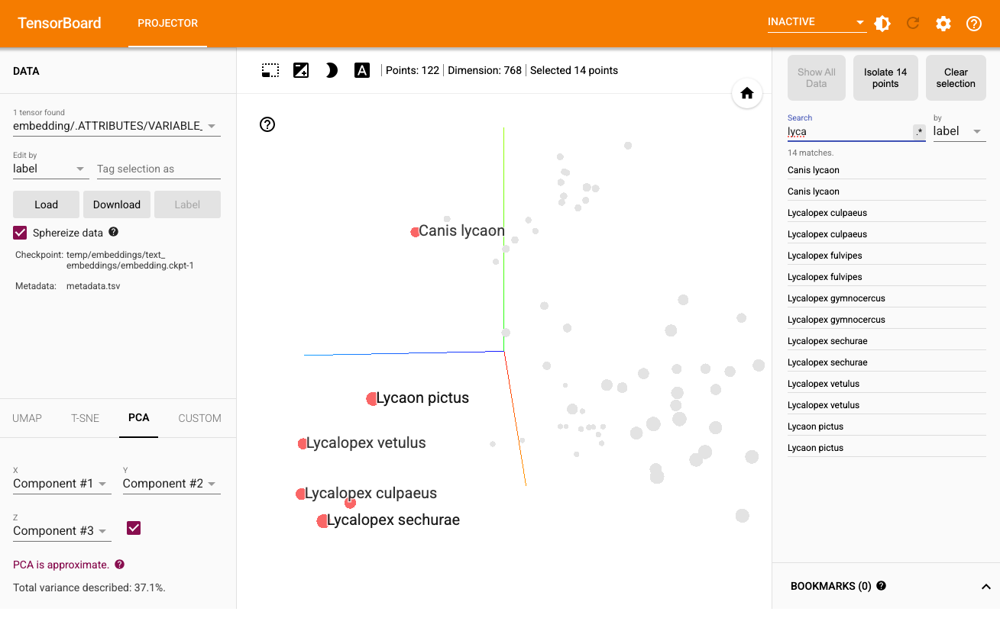

### Multimodal Text Embeddings

In [89]:
E_DIR = f'{DIR}/text_multimodal_embeddings'

Make local directory:

In [90]:
if not os.path.exists(E_DIR):
    os.makedirs(E_DIR)

Write labels to a metadata file with one label per line:

In [91]:
with open(os.path.join(E_DIR, 'metadata.tsv'), 'w') as f:
    for s in species:
          f.write(s + '\n')

Create numpy array of embeddings:

In [92]:
embed_array = np.array(text_multimodal_embeddings)

In [93]:
embed_array.shape

(122, 1408)

Save embeddings as a TensorFlow variable:

In [94]:
embed = tf.Variable(embed_array, name = 'text_multimodal_embeddings')

Create a TensorFlow model checkpoint:

In [95]:
checkpoint = tf.train.Checkpoint(embedding = embed)

Save the checkpoint to the local folder:

In [96]:
checkpoint.save(os.path.join(E_DIR, "embedding.ckpt"))

'temp/embeddings/text_multimodal_embeddings/embedding.ckpt-1'

Configure the TensorBoard Projector:

In [97]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(E_DIR, config)

Run Tensorboard with the log data:

Resource: https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks

**NOTE:** If you see "No dashboard are active for the current data set" message the do either of the following:
- press the reload button (circular arrow) in the upper right on the interface.
- or, select the dropdown list in the upper right, labeled "INACTIVE", and choose "PROJECTOR"

In [ ]:
%tensorboard --logdir $E_DIR

Screenshot of how this will appear:

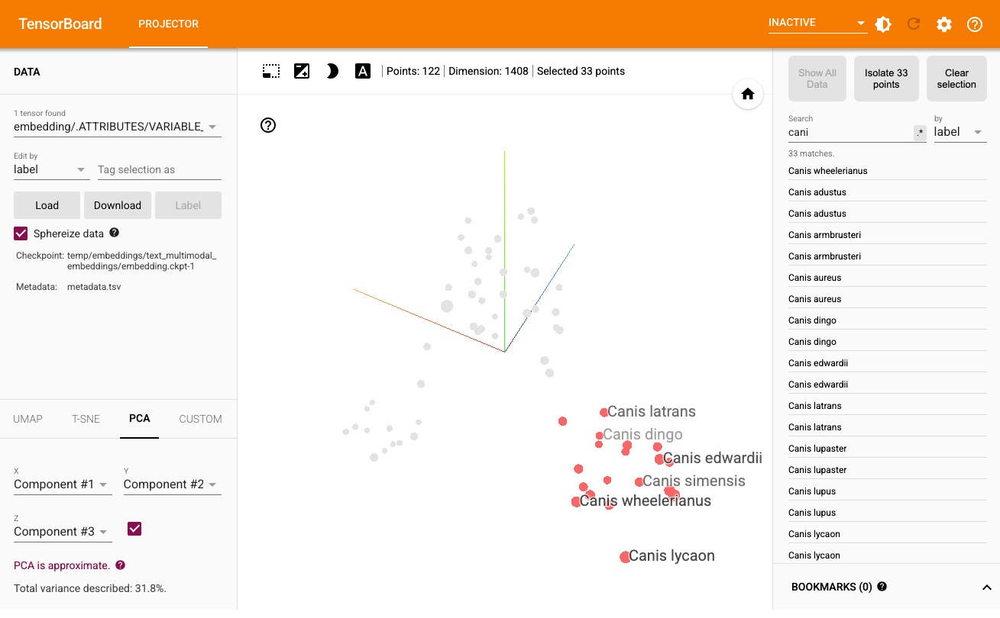

### Prepare Images For TensorBoard Projector

Digging deep into the code for the projector [on GitHub](https://github.com/tensorflow/tensorboard/blob/7d6572b8d853b47ffed851624f719e60bef3e5e9/tensorboard/plugins/projector/projector_plugin.py) yield the discovery that a sprite image can be use to replace the dots with thumbnail images.  A sprite is a composite image of images - think of it as a grid of thumbnails.  Order is important, it reads the matches for embeddings across rows, down columns.

First, create the `sprite.jpg` by:
- Use the `PIL` package
    - create a canvas for the sprite in maximum size for the projector: 8192*8192 pixels
    - calculate the grid size for the canvas based on the number of embeddings
    - load, resize, and place each image on the canvas in the position relative to the embeddings order
    - save the sprite to the log folder

In [99]:
import PIL.Image
import io

Calculate the sprite grid and thumbnail dimensions:

In [100]:
grid = int(np.ceil(np.sqrt(len(images))))
thumb_width = int(4000 / grid)
thumb_height = thumb_width
thumb_shape = (thumb_width, thumb_height)

Create a canvas to hold the sprite:

In [102]:
canvas = PIL.Image.new(
    mode = 'RGBA',
    size = (thumb_width * grid, thumb_height * grid),
    color = (0, 0, 0, 0)
)

Reshape the images into thumbnails, use letterboxing to make square, and place on the canvas:

In [103]:
for i, image in enumerate(images):
    # calculate placement in grid
    row = i // grid
    col = i % grid
    # load image from bytes to PIL
    full_image = PIL.Image.open(io.BytesIO(image))
    # resize within thumbnail size but not stretching
    ratio = min(thumb_shape[0] / full_image.width, thumb_shape[1] / full_image.height)
    thumb_image = full_image.resize((int(round(full_image.width * ratio)), int(round(full_image.height * ratio))))
    # letterbox if not square
    if thumb_image.width != thumb_image.height:
        letterbox_image = PIL.Image.new(
            mode = 'RGBA',
            size = (thumb_width * grid, thumb_height * grid),
            color = (0, 0, 0, 0)
        )
        letterbox_lr = int(round((thumb_shape[0] - thumb_image.width)/2))
        letterbox_tb = int(round((thumb_shape[1] - thumb_image.height)/2))
        letterbox_image.paste(thumb_image, (letterbox_lr, letterbox_tb))
        thumb_image = letterbox_image
    # place thumb on canvas
    canvas.paste(thumb_image, (col * thumb_width, row * thumb_height))
canvas = canvas.convert("RGB")

View the sprite:

In [ ]:
canvas

### Multimodal Image Embeddings

With thumbnails as points!

In [106]:
E_DIR = f'{DIR}/image_multimodal_embeddings'

Make local directory:

In [107]:
if not os.path.exists(E_DIR):
    os.makedirs(E_DIR)

Save sprite to directory:

In [108]:
canvas.save(os.path.join(E_DIR, 'sprite.jpg'), transparency = 0)

Write labels to a metadata file with one label per line:

In [109]:
with open(os.path.join(E_DIR, 'metadata.tsv'), 'w') as f:
    for s in species:
          f.write(s + '\n')

Create numpy array of embeddings:

In [110]:
embed_array = np.array(image_multimodal_embeddings)

In [111]:
embed_array.shape

(122, 1408)

Save embeddings as a TensorFlow variable:

In [112]:
embed = tf.Variable(embed_array, name = 'image_multimodal_embeddings')

Create a TensorFlow model checkpoint:

In [113]:
checkpoint = tf.train.Checkpoint(embedding = embed)

Save the checkpoint to the local folder:

In [114]:
checkpoint.save(os.path.join(E_DIR, "embedding.ckpt"))

'temp/embeddings/image_multimodal_embeddings/embedding.ckpt-1'

Configure the TensorBoard Projector:

In [115]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
embedding.sprite.image_path = 'sprite.jpg'
embedding.sprite.single_image_dim.extend(thumb_shape)
projector.visualize_embeddings(E_DIR, config)

This creates the `projector_config.pbtxt` in the directory which looks like:

In [120]:
with open(os.path.join(E_DIR, 'projector_config.pbtxt'), 'r') as file:
    data = file.read()
Markdown(f"```python\n\n{data}\n```")

```python

embeddings {
  tensor_name: "embedding/.ATTRIBUTES/VARIABLE_VALUE"
  metadata_path: "metadata.tsv"
  sprite {
    image_path: "sprite.jpg"
    single_image_dim: 333
    single_image_dim: 333
  }
}

```

Run Tensorboard with the log data:

Resource: https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks

**NOTE:** If you see "No dashboard are active for the current data set" message the do either of the following:
- press the reload button (circular arrow) in the upper right on the interface.
- or, select the dropdown list in the upper right, labeled "INACTIVE", and choose "PROJECTOR"

In [ ]:
%tensorboard --logdir $E_DIR

Screenshot of how this will appear:
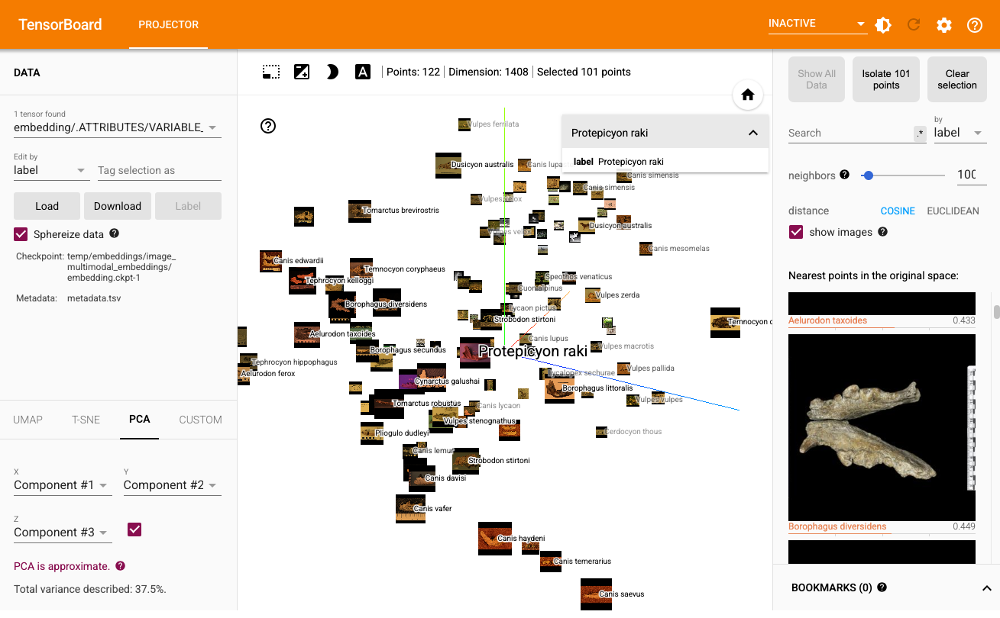



---
## Using `projector.tensorflow.org`

You can load data with `projector.tensorflow.org` as long as it is in public locations.  You can actually load directly from your computer with the interface but here the processes of automating the load is covered.

By loading the website with `/?config=https://path/to/config.json` where `config.json` is like the `projector_config.pbtxt` file created in the sections above.

### Create The TensorBoard Log data And Commit To GitHub With This Notebook

This section recreates the Multimodal text embedding preparation in a folder that will be pushed to GitHub for use with `projector.tensorflow.org` while also representing the embeddings with the associated images from the `sprite.jpg` file created above.

In [144]:
E_DIR = f'code/{EXPERIMENT}/tensorboard/image_multimodal_embeddings'

Make local directory:

In [145]:
if not os.path.exists(E_DIR):
    os.makedirs(E_DIR)

Save sprite to directory:

In [146]:
canvas.save(os.path.join(E_DIR, 'sprite.jpg'), transparency = 0)

Write labels to a metadata file with one label per line:

In [147]:
with open(os.path.join(E_DIR, 'metadata.tsv'), 'w') as f:
    for s in species:
          f.write(s + '\n')

Create a file of embeddings.  The requested format is a `TSV` file, one row per vector, elements of vector are `\t` delimited:

In [148]:
with open(os.path.join(E_DIR, 'embeddings.tsv'), 'w') as f:
    for embedding in text_multimodal_embeddings:
        for e, element in enumerate(embedding):
            if e > 0:
                f.write('\t')
            f.write(str(element))
        f.write('\n')

Create The `projector_config.json`:

In [149]:
# update this prefix to the repository you are working in:
repo_raw_prefix = 'https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Applied%20GenAI'

projector_config = {
    "embeddings": [
        {
            "tensorName" : "Image Embeddings",
            "tensorShape" : [len(text_multimodal_embeddings), len(text_multimodal_embeddings[0])],
            "tensorPath" : f"{repo_raw_prefix}/{E_DIR}/embeddings.tsv",
            "metadataPath" : f"{repo_raw_prefix}/{E_DIR}/metadata.tsv",
            "sprite" : {
                "imagePath" : f"{repo_raw_prefix}/{E_DIR}/sprite.jpg",
                "singleImageDim" : [thumb_width, thumb_height]
            }
        }
    ]
}

In [150]:
projector_config

{'embeddings': [{'tensorName': 'Image Embeddings',
   'tensorShape': [122, 1408],
   'tensorPath': 'https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Applied%20GenAI/code/embeddings/tensorboard/image_multimodal_embeddings/embeddings.tsv',
   'metadataPath': 'https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Applied%20GenAI/code/embeddings/tensorboard/image_multimodal_embeddings/metadata.tsv',
   'sprite': {'imagePath': 'https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Applied%20GenAI/code/embeddings/tensorboard/image_multimodal_embeddings/sprite.jpg',
    'singleImageDim': [333, 333]}}]}

In [151]:
with open(os.path.join(E_DIR, 'projector_config.json'), 'w') as f:
    json.dump(projector_config, f)

### Commit & Push To GitHub

At this point, the file are local.  Do a git commit and push to GitHub so the files can be read directly by `projector.tensorflow.org`.

### View On `projector.tensorflow.org`

This link will work even if you are just reviewing this notebook as it loads data directly from this GitHub repository.  Try it out!

In [153]:
print(f"http://projector.tensorflow.org/?config={repo_raw_prefix}/{E_DIR}/projector_config.json")

http://projector.tensorflow.org/?config=https://raw.githubusercontent.com/statmike/vertex-ai-mlops/main/Applied%20GenAI/code/embeddings/tensorboard/image_multimodal_embeddings/projector_config.json


This will present a page like the following:

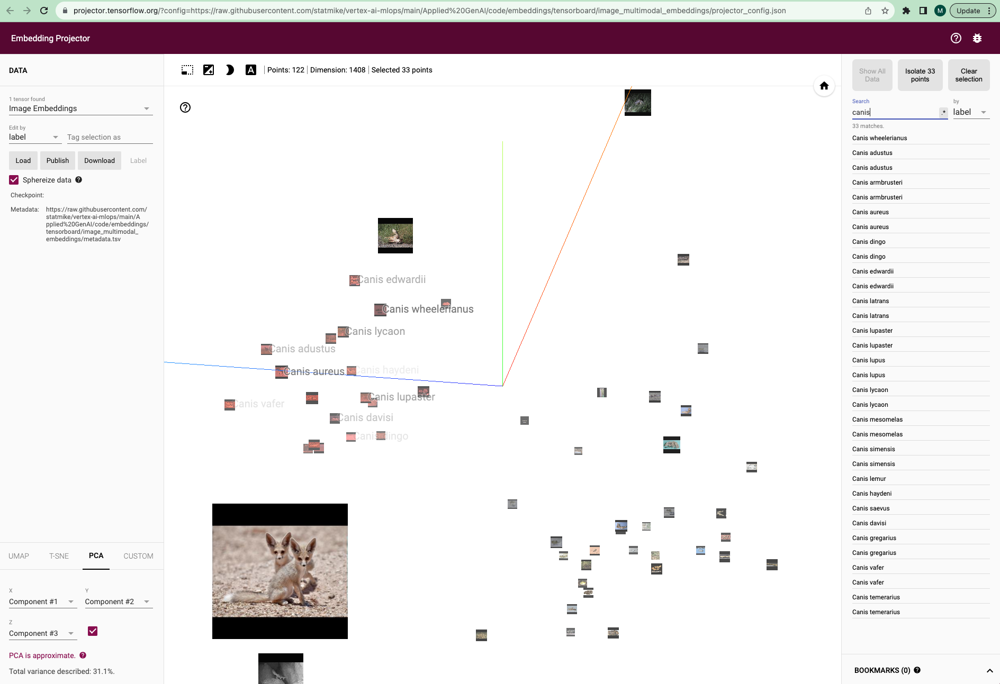